<a href="https://colab.research.google.com/github/mcaicedovezga/Estadistica-1-/blob/main/Parte_2_segundo_parcial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Estadistica descriptiva para variables cuantitativas

Desarrollo parte practica segundo parcial Estadistica
Integrantes:


*   Maria Jose Caicedo Vezga 2231946
*   Angie Marieth Ortega Jaimes 2232446
*  Nixon Reynaldo Rojas Guevara 2231944






In [5]:
from google.colab import files
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


In [9]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')
tabla.head(8)

/tmp/ipython-input-531879632.py:4: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io_csv, sep=",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1
8,1,1,1,NaN,1,7,5,2022,12,1,...,2,21/09/2017,4,1,1.0,29,8,2,1.0,1
76,1,1,1,NaN,2,4,4,2022,12,1,...,1,NaN,1,2,2.0,21,2,5,1.0,1
85,250,2,2,NaN,1,6,5,2022,10,5,...,6,22/09/2019,6,2,2.0,19,2,5,5.0,1
76,1,1,1,NaN,1,6,4,2022,12,1,...,1,NaN,1,5,NaN,40,99,99,1.0,1
11,1,1,1,NaN,2,4,4,2022,12,1,...,2,04/01/2016,2,1,1.0,28,5,11,1.0,1


In [11]:
df = tabla[["EDAD_PADRE","EDAD_MADRE","N_HIJOSV"]]
df.head(6)


,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2
76,21,3,1
85,19,4,6


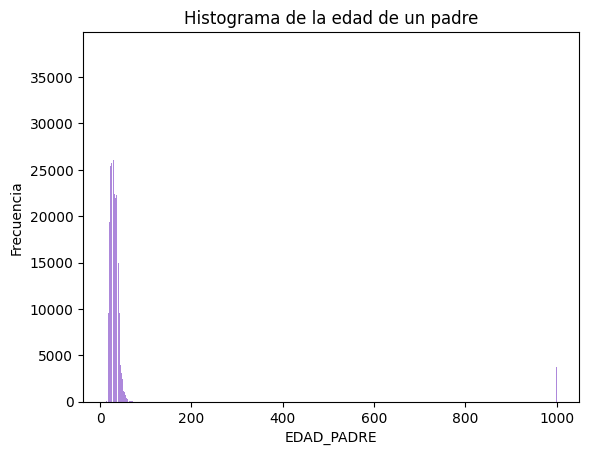

In [13]:
import matplotlib.pyplot as plt
intervalos = range(min(df.EDAD_PADRE),max(df.EDAD_PADRE)+2)
plt.hist(x=df.EDAD_PADRE,bins=intervalos,color="#ad88db",rwidth=0.85)
plt.title("Histograma de la edad de un padre")
plt.xlabel("EDAD_PADRE")
plt.ylabel("Frecuencia")
plt.show()

In [14]:
df1= df[(df.EDAD_PADRE <120) & (df.EDAD_MADRE !=99) & (df.N_HIJOSV !=99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_HIJOSV
COD_DPTO,,,
8,29,3,2
11,24,5,2
27,25,3,4
8,29,4,2
76,21,3,1


/tmp/ipython-input-774470698.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = 'darkblue')


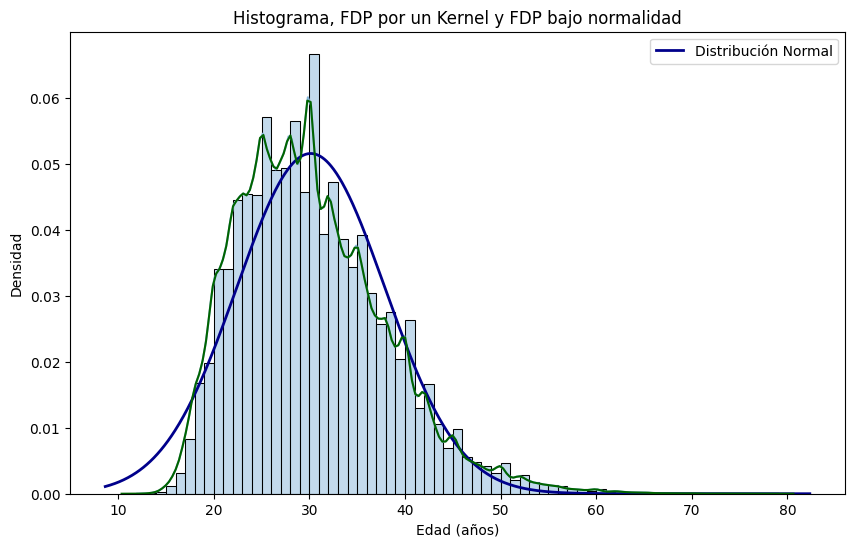

In [15]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
intervalos = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plt.figure(figsize=(10,6))
sns.histplot(x=df1.EDAD_PADRE, bins=intervalos, kde=True, stat="density", color="#88b7db" , edgecolor="black")

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = 'darkblue')
sns.kdeplot(x=df1.EDAD_PADRE, color="darkgreen")
# Etiquetas y título
plt.title("Histograma, FDP por un Kernel y FDP bajo normalidad")
plt.xlabel("Edad (años)")
plt.ylabel("Densidad")
plt.legend()
# Mostrar el gráfico
plt.show()

Sea $X:=$(Edad del padre de un recien nacido en Colombia)

Descriptivamente como la función de densidad de probabilidad de los datos estimada por un metodo Kernel (Linea Cyan).No conside con la función de densidad de probabilidad bajo normalidad (linea azul) , $X\sim \text{Normal} (\text{Media} = \bar{x}, \text{Varianza}=s^2_x)$ , entonces no asumimos normalidad


In [16]:
from scipy.stats import shapiro
shapiro(df1.EDAD_PADRE)

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 568276.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9627148118717348), pvalue=np.float64(1.919587188982723e-116))

* Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipotesis nula con una confianza del 95%
* si el **valor p** en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipotesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue = 0.0 < 0.05, es decir , se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en colombia presenta distribución normal.

In [17]:
df1.EDAD_PADRE
len(df1.EDAD_PADRE)

568276

In [92]:
idx = np.random.randint(len(df1.EDAD_PADRE), size=100)
shapiro(df1.EDAD_PADRE.index[idx])

ShapiroResult(statistic=np.float64(0.8501012089536958), pvalue=np.float64(1.1961392849572858e-08))

Formalmente, el valor $p$ obtenido en la prueba de normalidad fue:

$$
p = 1.1961392849572858 \times 10^{-8}
$$

Dado que este valor es menor que $0.05$, rechaza la hipótesis nula de que la variable aleatoria $X$ (edad del padre de un recién nacido en Colombia) presenta una distribución normal.  




<Axes: xlabel='EDAD_PADRE'>

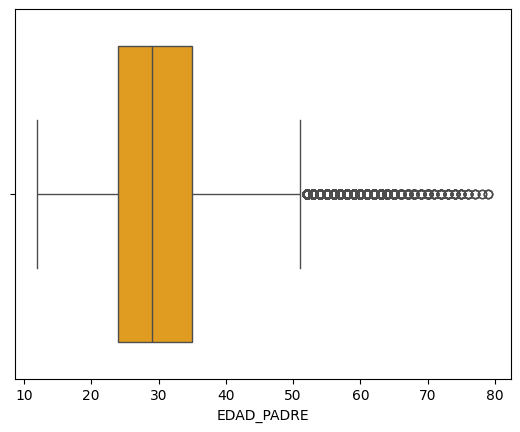

In [46]:
sns.boxplot(x=df1.EDAD_PADRE,color='orange',saturation=0.75)


Se considera que la edad de un padre de un recien nacido en Colombia es atípica es mayor que 50 años. El primer cuartil es de aproximadamente 25 años, la media aritmetica es aproximadamente 28 , y el tercel cuartil es aproximadamente 35 años.

$\text(Rango intercuartilico = Tercer cuartil - Primer cuartil)=35-25 = 10$




In [95]:
import plotly.express as px
plt.figure(figsize=(3, 3))
fig = px.strip(df1.EDAD_PADRE,orientation="h")
fig.show()

<Figure size 300x300 with 0 Axes>


De acuerdo a nuestro diagrama de puntos se observa una alta variabilidad de la edad de un padre de un recién nacido en Colombia

In [48]:
from scipy.stats import skew, kurtosis
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza: {np.var(df1.EDAD_PADRE)} y la desviación estándar: {np.std(df1.EDAD_PADRE)}")
print(f"Asimetria: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")


Media: 30.148239587805925
Varianza: 59.92624560757446 y la desviación estándar: 7.741204402906208
Asimetria: 0.7932649439125867
Curtosis: 0.8974620245423521



*   Aproximadamente el promedio de la edad de un padre de un recié nacido es de 30.15 años
*   Aproximadamente la distancia entre los valos de la edad de una padre de un recién nacido en Colombia y la media es de 7.7 años
*   La distribución de la edad de un padre de un recien nacido en Colomnia es asimétrica positiva es decir la media es mayor que la moda de la variable
*   La curtosis es igual a 0.9 menor que 3 entonces es platicúrtida es decir hay una baja concentración de las edades con respecto a la media





# Estadistica descriptiva para datos Bivariados
* Diagrama de disperción y la recta de regresión para datos bivariados

Una variable depende de la otra, cuando la ejecución de esta se ve afectada por una variable independiente. *Ejemplo* : El precio de una vivienda depende de el número de habitaciones ya que entre mas habitaciones tiene mayor precio

Una variable está correlacionada con otra, cuando guardan cierta relación
pero no es posible hablar de dependencia. *Ejemplo :* Consumo de arroz y de carne ya que se ha visto que al comer mas arroz se come mas carne, pero ninguna variable depende la otra

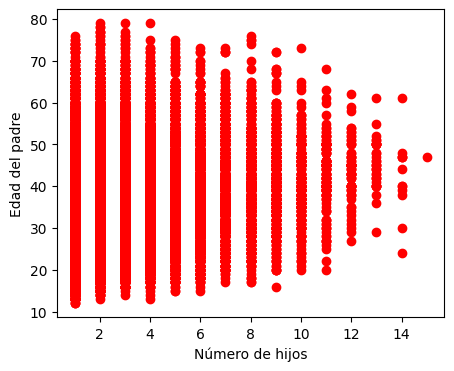

In [49]:
plt.figure(figsize=(5,4))
plt.scatter(df1.N_HIJOSV, df1.EDAD_PADRE, color="red", marker="o")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre')
plt.show()

Se observa en el diagrama de dispérsión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no estan correlacionadas. Para nuestro ejemplo quiere decir que el número de hijos y a edad del padre en Colombia no estan correlacionadas (padre joven con muchos hijos o padre mayor con pocos hijos)

In [53]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
modelo.fit(np.array(df1.N_HIJOSV).reshape(-1,1), np.array(df1.EDAD_PADRE).reshape(-1,1))
predi_lineal=modelo.predict(np.array(df1.N_HIJOSV).reshape(-1,1))
predi_lineal

array([[30.29315726],
       [30.29315726],
       [34.62354964],
       ...,
       [30.29315726],
       [32.45835345],
       [30.29315726]])

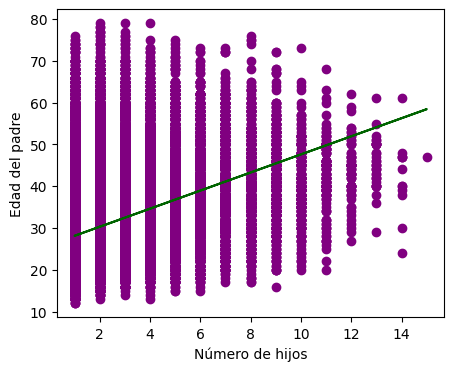

In [54]:
plt.figure(figsize=(5,4))
plt.scatter(df1.N_HIJOSV, df1.EDAD_PADRE, color="purple", marker="o")
plt.plot(df1.N_HIJOSV, predi_lineal, linestyle='-', color="darkgreen")
plt.xlabel('Número de hijos')
plt.ylabel('Edad del padre')
plt.show()


De acuerdo con la recta de regresión se determina una corelación positiva, es decir que entre más hijos tiene un hombre en Colombia, más años tiene esa persona.

*la variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y*

In [55]:
from scipy.stats import spearmanr, kendalltau

coef_pearson= np.corrcoef(df1['N_HIJOSV'], df1['EDAD_PADRE'])[0,1]
coef_spearman, _= spearmanr(df1['N_HIJOSV'], df1['EDAD_PADRE'])
coef_kendall, _= kendalltau(df1['N_HIJOSV'], df1['EDAD_PADRE'])
print(f"Coeficiente de correlación de Pearson, spearman y kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")

Coeficiente de correlación de Pearson, spearman y kendall son respectivamente 0.3308429858965031, 0.3563003702777745 y 0.28081560831586566.



Para la interpretación de los coeficientes de correlación nos ayudaremos de la referencia:  

Landis, J. R., & Koch, G. G. (1977). The measurement of observer agreement for categorical data. biometrics, 159-174. [Link](https://www.jstor.org/stable/pdf/2529310.pdf)

* X y Y son independientes o no están correlacionadas: $\rho(X,Y) \approx 0$ ,$\eta(X,Y) \approx 0$ , $\kappa(X,Y) \approx 0$.
* Y depende insignificativamente de X o X y Y están insignificativamente correlacionadas si $0 < \vert \rho(X,Y) \vert < 0.2$ , $0 < \eta(X,Y) < 0.2$ , $0 < \vert \kappa(X,Y) \vert < 0.2$
* Y depende discretamente de X o X y Y están discretamente correlacionadas si $0.2 < \vert \rho(X,Y) \vert < 0.4$ , $0.2 < \eta(X,Y) < 0.4$ , $0.2 < \vert \kappa(X,Y) \vert < 0.4$
* Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho(X,Y) \vert < 0.6$ , $0.4 < \eta(X,Y) < 0.6$ , $0.4 < \vert \kappa(X,Y) \vert < 0.6$
*  Y depende sustancialmente de X o X y Y están sustancialmente correlacionadas si $0.6 < \vert \rho(X,Y) \vert < 0.8$ , $0.6 < \eta(X,Y) < 0.8$ , $0.6 < \vert \kappa(X,Y) \vert < 0.8$
*  Y depende moderadamente de X o X y Y están moderadamente correlacionadas si $0.4 < \vert \rho(X,Y) \vert < 0.6$ , $0.4 < \eta(X,Y) < 0.6$ , $0.4 < \vert \kappa(X,Y) \vert < 0.6$







De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de hijos de un padre y la edad de un padre de un recien nacido estan dicretamente correlacionadas.